In [1]:
!git clone https://github.com/cleardusk/3DDFA_V2.git
%cd 3DDFA_V2
!sh ./build.sh

Cloning into '3DDFA_V2'...
remote: Enumerating objects: 706, done.
remote: Total 706 (delta 0), reused 0 (delta 0), pack-reused 706 (from 1)
Receiving objects: 100% (706/706), 74.78 MiB | 22.58 MiB/s, done.
Resolving deltas: 100% (366/366), done.
/kaggle/working/3DDFA_V2
running build_ext
cythoning nms/cpu_nms.pyx to nms/cpu_nms.c
/opt/conda/lib/python3.7/site-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /kaggle/working/3DDFA_V2/FaceBoxes/utils/nms/cpu_nms.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'nms.cpu_nms' extension
creating build
creating build/temp.linux-x86_64-3.7
creating build/temp.linux-x86_64-3.7/nms
gcc -pthread -B /opt/conda/compiler_compat -Wl,--sysroot=/ -Wsign-compare -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -fPIC -I/opt/conda/lib/python3.7/site-packages/numpy/core/include -I/opt/conda/include/python3.7m -c nms/cpu_nms.c -

In [2]:
# before import, make sure FaceBoxes and Sim3DR are built successfully

import cv2
import yaml

from FaceBoxes import FaceBoxes
from TDDFA import TDDFA
from utils.render import render
from utils.depth import depth
from utils.pncc import pncc
from utils.uv import uv_tex
from utils.pose import viz_pose
from utils.serialization import ser_to_ply, ser_to_obj
from utils.functions import draw_landmarks, get_suffix

import matplotlib.pyplot as plt
from skimage import io
from IPython.display import Image

### Load configs

In [3]:
# load config
cfg = yaml.load(open('configs/mb1_120x120.yml'), Loader=yaml.SafeLoader)

# Init FaceBoxes and TDDFA, recommend using onnx flag
onnx_flag = True  # or True to use ONNX to speed up
if onnx_flag:
    !pip install onnxruntime
    
    import os
    os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
    os.environ['OMP_NUM_THREADS'] = '4'
    from FaceBoxes.FaceBoxes_ONNX import FaceBoxes_ONNX
    from TDDFA_ONNX import TDDFA_ONNX

    face_boxes = FaceBoxes_ONNX()
    tddfa = TDDFA_ONNX(**cfg)
else:
    face_boxes = FaceBoxes()
    tddfa = TDDFA(gpu_mode=False, **cfg)

     |████████████████████████████████| 5.7 MB 13.0 MB/s eta 0:00:01
     |████████████████████████████████| 46 kB 3.4 MB/s  eta 0:00:01
     |████████████████████████████████| 15.7 MB 53.9 MB/s eta 0:00:01
     |████████████████████████████████| 86 kB 6.7 MB/s  eta 0:00:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.18.5
    Uninstalling numpy-1.18.5:
      Successfully uninstalled numpy-1.18.5
ERROR: After October 2020 you may experience errors when installing or updating packages. This is because pip will change the way that it resolves dependency conflicts.

We recommend you use --use-feature=2020-resolver to test your packages with the new resolver before it becomes the default.

tensorflow 2.3.1 requires numpy<1.19.0,>=1.16.0, but you'll have numpy 1.21.6 which is incompatible.
kmeans-smote 0.1.2 requires imbalanced-learn<0.5,>=0.4.0, but you'll have imbalanced-learn 0.7.0 which is incompatible.
kmeans-smote 0.1.2 requires numpy<1.16,>=1.13, but you'll 

RuntimeError: module compiled against API version 0xe but this version of numpy is 0xd

SystemError: <built-in function __import__> returned a result with an error set

/opt/conda/lib/python3.7/site-packages/torch/onnx/utils.py:958: UserWarning: No names were found for specified dynamic axes of provided input.Automatically generated names will be applied to each dynamic axes of input input
  'Automatically generated names will be applied to each dynamic axes of input {}'.format(key))
/opt/conda/lib/python3.7/site-packages/torch/onnx/utils.py:958: UserWarning: No names were found for specified dynamic axes of provided input.Automatically generated names will be applied to each dynamic axes of input output
  'Automatically generated names will be applied to each dynamic axes of input {}'.format(key))
/opt/conda/lib/python3.7/site-packages/torch/onnx/utils.py:958: UserWarning: No names were found for specified dynamic axes of provided input.Automatically generated names will be applied to each dynamic axes of input alpha_shp
  'Automatically generated names will be applied to each dynamic axes of input {}'.format(key))
/opt/conda/lib/python3.7/site-packa

Convert /kaggle/working/3DDFA_V2/FaceBoxes/weights/FaceBoxesProd.pth to /kaggle/working/3DDFA_V2/FaceBoxes/weights/FaceBoxesProd.onnx done.
Convert configs/bfm_noneck_v3.pkl to configs/bfm_noneck_v3.onnx done.
weights/mb1_120x120.onnx does not exist, try to convert the `.pth` version to `.onnx` online
Convert weights/mb1_120x120.pth to weights/mb1_120x120.onnx done.


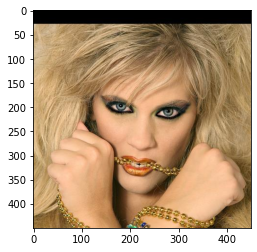

In [58]:
# given an image path or the image url

img_fp = '/kaggle/input/aflw2000-3d/AFLW2000/image00002.jpg'
img = cv2.imread(img_fp)
plt.imshow(img[..., ::-1])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# img_url = 'https://th.bing.com/th/id/OIP.ad49RLshK2_4m6afjluu8AHaLH?rs=1&pid=ImgDetMain'
# img = io.imread(img_url)
# plt.imshow(img)
# plt.axis('off')

img = img[..., ::-1]  # RGB -> BGR

### Detect faces using FaceBoxes

In [59]:
# face detection
boxes = face_boxes(img)
print(f'Detect {len(boxes)} faces')
print(boxes)

Detect 1 faces
[[131.87631, 98.21885, 337.79462, 374.76056, 0.99945825]]


### Regressing 3DMM parameters, reconstruction and visualization

In [60]:
# regress 3DMM params
param_lst, roi_box_lst = tddfa(img, boxes)

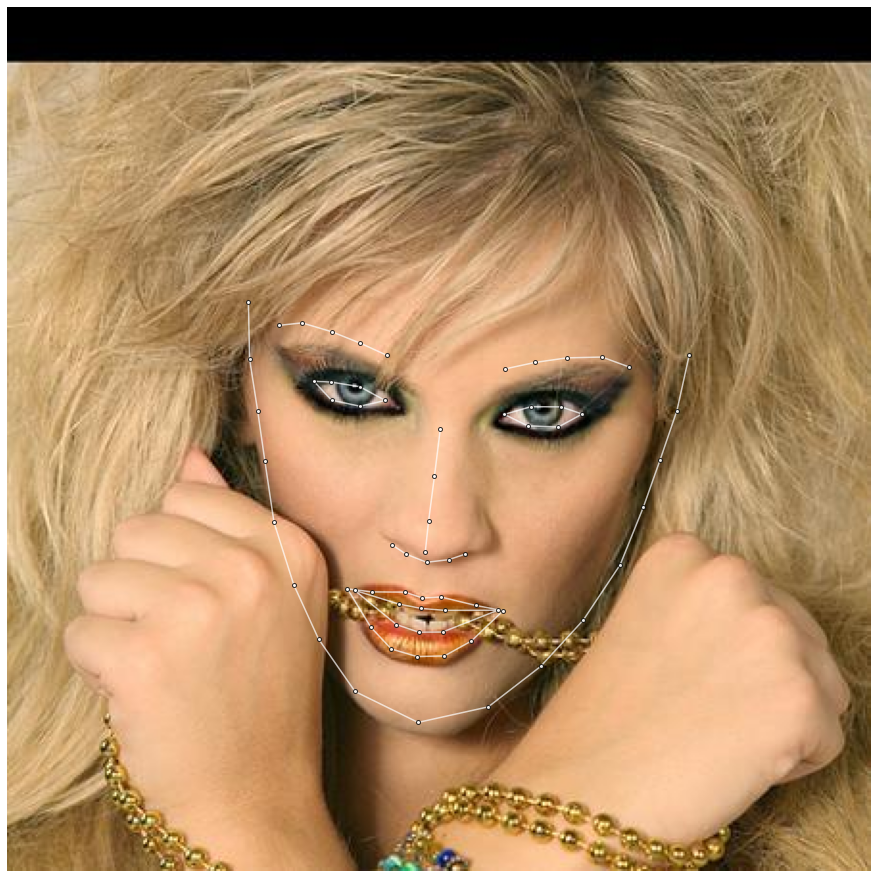

In [61]:
# reconstruct vertices and visualizing sparse landmarks
dense_flag = False
ver_lst = tddfa.recon_vers(param_lst, roi_box_lst, dense_flag=dense_flag)
draw_landmarks(img, ver_lst, dense_flag=dense_flag)

ver_lst_ld = ver_lst

Vertices shape: (1, 3, 68)


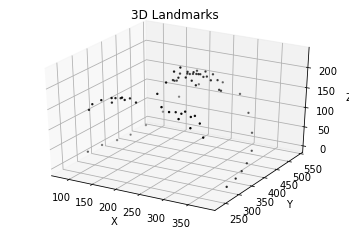

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


if img is None:
    print("Error: Image not found. Please check the path.")
else:
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization

    # Load landmarks from the text file or defined array
    vertices = np.array(ver_lst)  # Ensure `ver_lst` is defined

    # Check the shape of vertices before processing
    print("Vertices shape:", vertices.shape)

    # Reshape vertices to get (1, 3, 68) format for landmarks
    if vertices.shape[0] == 1 and vertices.shape[1] == 3 and vertices.shape[2] == 68:
        # Extract 3D landmarks
        landmarks_3d = vertices[0, :, :]  # Shape will be (3, 68)

        # Create a 3D plot
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        # Plot the 3D landmarks
        ax.scatter(landmarks_3d[0], landmarks_3d[1], landmarks_3d[2], c='k', s=2)  # Black color, size 5

        # Set labels
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.set_title('3D Landmarks')

        plt.show()
    else:
        print("Error: Unexpected shape of vertices. Expected shape (1, 3, 68), got:", vertices.shape)


Vertices shape: (1, 3, 68)
Reshaped landmarks shape: (2, 68)
Sufficient landmarks found: 68


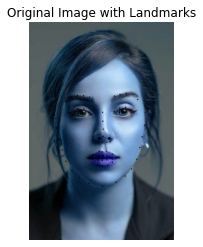

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def draw_landmarks(image, landmarks, color=(0, 0, 0), radius=2):  # Set color to black and reduce radius
    """Draws landmarks on the image."""
    for (x, y) in landmarks:
        cv2.circle(image, (int(x), int(y)), radius, color, -1)  # Drawing with specified color and radius
    return image


if img is None:
    print("Error: Image not found. Please check the path.")
else:
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization

    # Load landmarks from the text file or defined array
    vertices = np.array(ver_lst)  # Ensure `ver_lst` is defined

    # Check the shape of vertices before processing
    print("Vertices shape:", vertices.shape)

    # Reshape vertices to get (1, 2, 68) format for landmarks
    if vertices.shape[0] == 1 and vertices.shape[1] == 3 and vertices.shape[2] == 68:
        # Reshape to (1, 2, 68) by selecting the first two channels (x, y)
        landmarks_reshaped = vertices[0, :2, :]  # Taking the first two rows (x and y)
        print("Reshaped landmarks shape:", landmarks_reshaped.shape)  # Debugging statement

        # Now landmarks_reshaped has shape (2, 68), we can transpose it
        landmarks_2d = landmarks_reshaped.T  # Transpose to (68, 2)

        # Check if landmarks are valid
        if landmarks_2d.shape[0] < 55:  # Ensure enough landmarks
            print("Error: Not enough landmarks for manipulation, found:", landmarks_2d.shape[0])
        else:
            print("Sufficient landmarks found:", landmarks_2d.shape[0])

            # Visualize the original landmarks on the image
            img_with_landmarks = draw_landmarks(img.copy(), landmarks_2d)  # Use landmarks_2d directly

            # Plot the image with landmarks
            plt.imshow(img_with_landmarks)
            plt.title('Original Image with Landmarks')
            plt.axis('off')
            plt.show()
    else:
        print("Error: Unexpected shape of vertices. Expected shape (1, 3, 68), got:", vertices.shape)


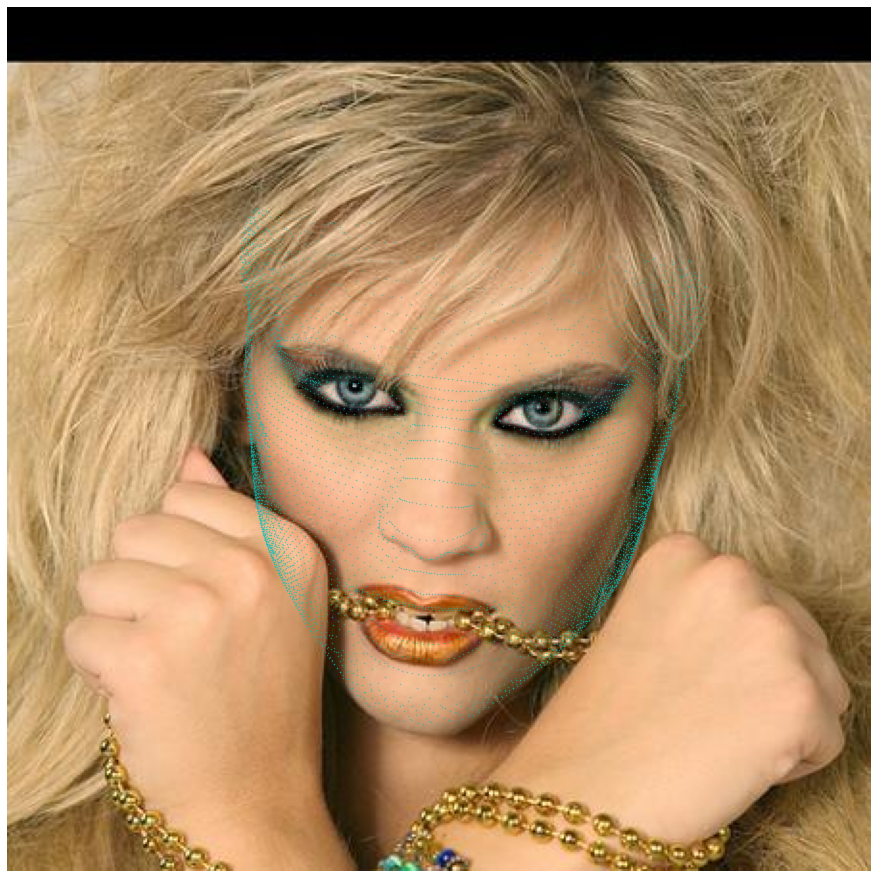

In [46]:
# reconstruct vertices and visualizing dense landmarks
dense_flag = True
ver_lst = tddfa.recon_vers(param_lst, roi_box_lst, dense_flag=dense_flag)
draw_landmarks(img, ver_lst, dense_flag=dense_flag)

In [47]:
ver_lst[0].shape, ver_lst_ld[0].shape

((3, 38365), (3, 68))

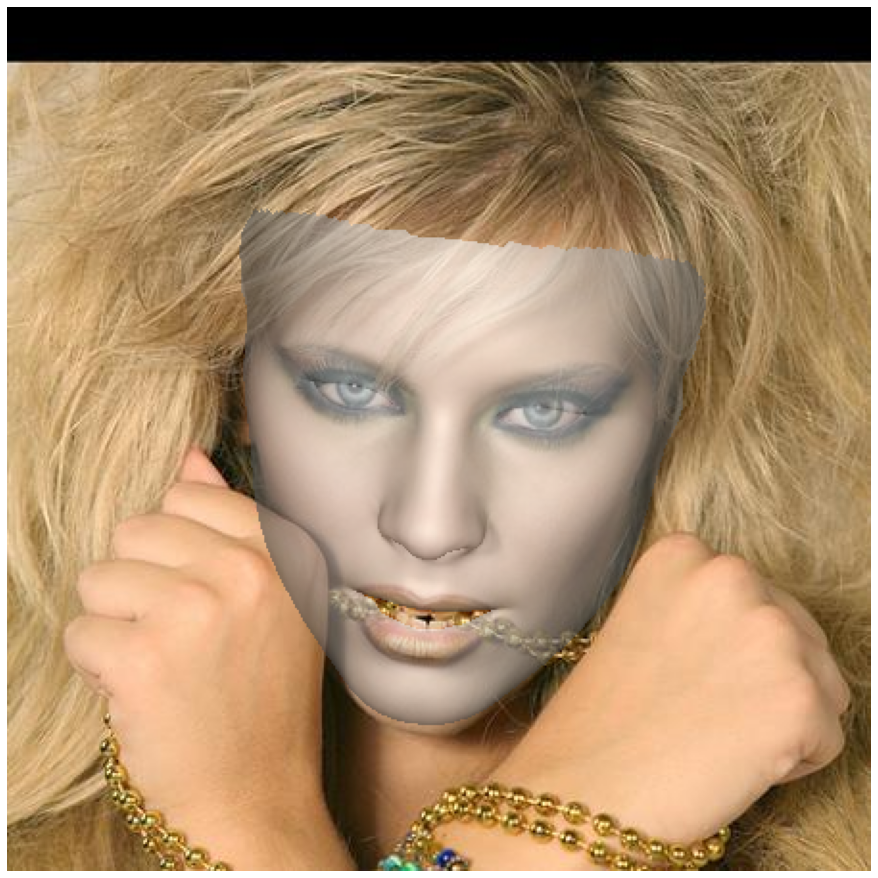

In [48]:
# reconstruct vertices and render
ver_lst = tddfa.recon_vers(param_lst, roi_box_lst, dense_flag=dense_flag)
render(img, ver_lst, tddfa.tri, alpha=0.6, show_flag=True);

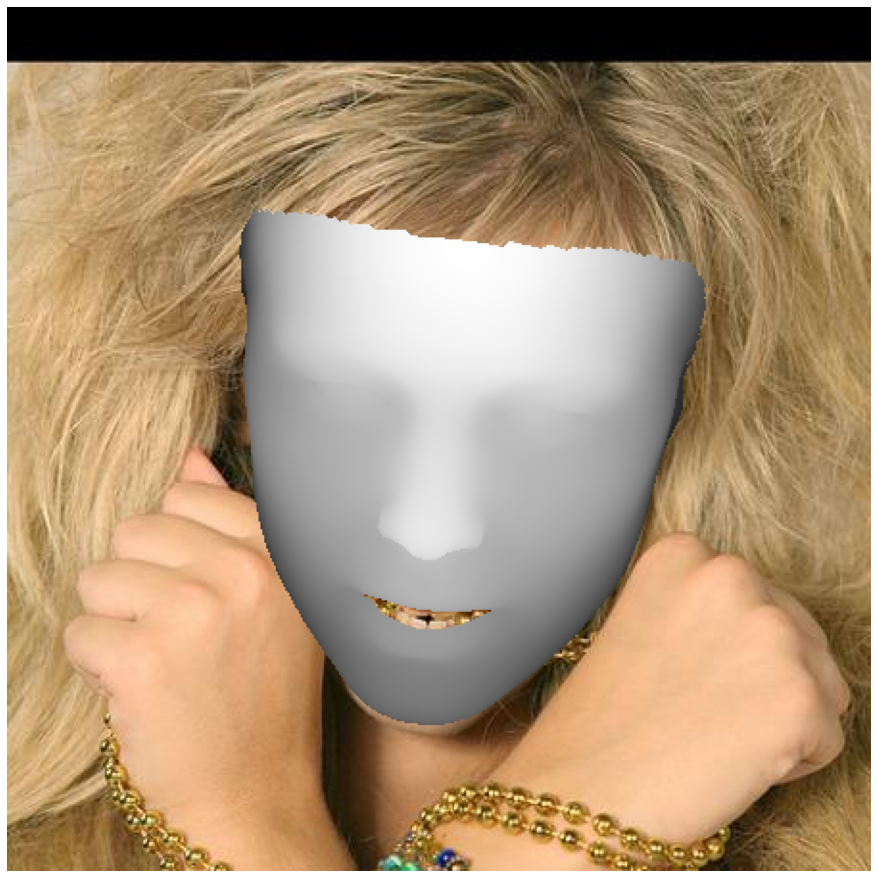

In [49]:
# reconstruct vertices and render depth
ver_lst = tddfa.recon_vers(param_lst, roi_box_lst, dense_flag=dense_flag)
depth(img, ver_lst, tddfa.tri, show_flag=True);

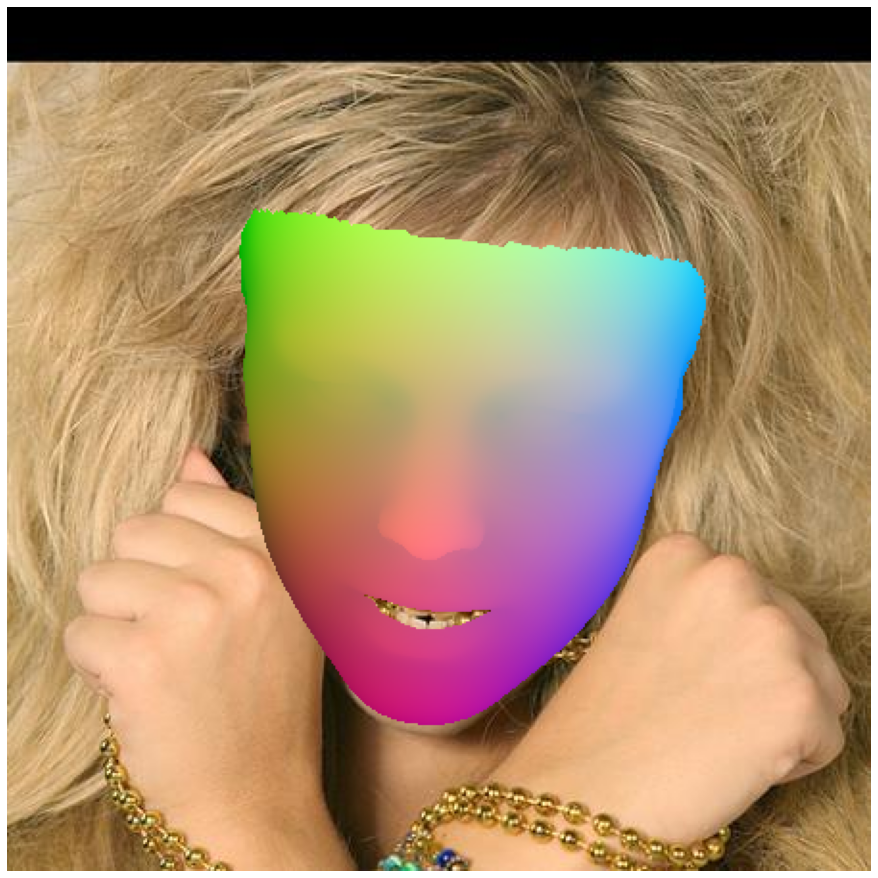

In [50]:
# reconstruct vertices and render pncc
ver_lst = tddfa.recon_vers(param_lst, roi_box_lst, dense_flag=dense_flag)
pncc(img, ver_lst, tddfa.tri, show_flag=True);

In [51]:
# running offline
# %%bash
for OPT in ['2d_sparse', '2d_dense', '3d', 'depth', 'pncc', 'pose', 'uv_tex', 'ply', 'obj']:
    !python demo.py -f examples/inputs/trump_hillary.jpg -o $OPT --show_flag=false --onnx;

2024-11-01 11:12:14.201543257 [W:onnxruntime:, execution_frame.cc:835 VerifyOutputSizes] Expected shape from model of {1,16680,2} does not match actual shape of {1,11596,2} for output 353
2024-11-01 11:12:14.202768000 [W:onnxruntime:, execution_frame.cc:835 VerifyOutputSizes] Expected shape from model of {-1,16680,4} does not match actual shape of {1,11596,4} for output output
Detect 2 faces
Save visualization result to examples/results/trump_hillary_2d_sparse.jpg
2024-11-01 11:12:17.367075846 [W:onnxruntime:, execution_frame.cc:835 VerifyOutputSizes] Expected shape from model of {1,16680,2} does not match actual shape of {1,11596,2} for output 353
2024-11-01 11:12:17.368167148 [W:onnxruntime:, execution_frame.cc:835 VerifyOutputSizes] Expected shape from model of {-1,16680,4} does not match actual shape of {1,11596,4} for output output
Detect 2 faces
Save visualization result to examples/results/trump_hillary_2d_dense.jpg
2024-11-01 11:12:20.492078837 [W:onnxruntime:, execution_frame.

In [25]:
!ls examples/results/

trump_hillary_2d_dense.jpg   trump_hillary_obj.obj   trump_hillary_uv_tex.jpg
trump_hillary_2d_sparse.jpg  trump_hillary_ply.ply   videos
trump_hillary_3d.jpg	     trump_hillary_pncc.jpg
trump_hillary_depth.jpg      trump_hillary_pose.jpg


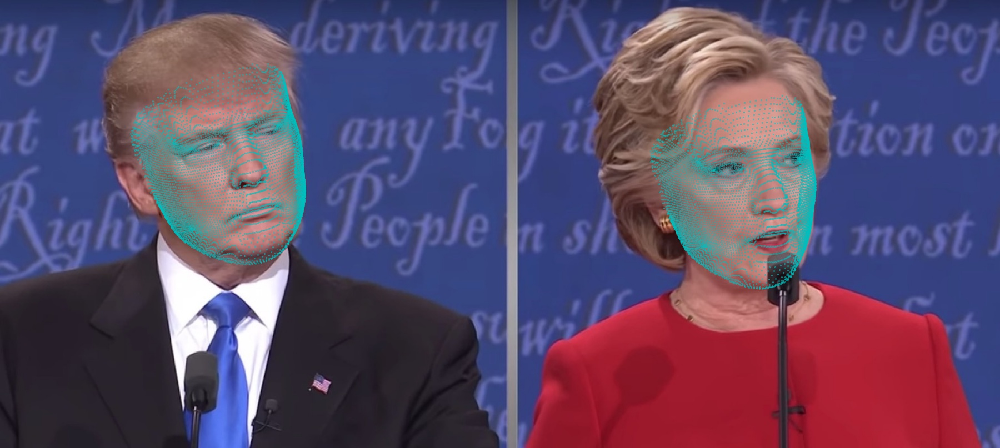

In [26]:
Image('examples/results/trump_hillary_2d_dense.jpg')

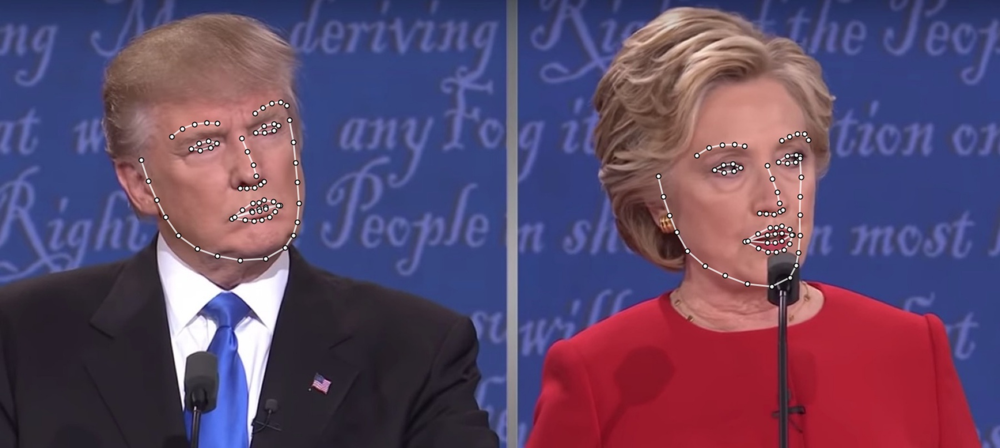

In [27]:
Image('examples/results/trump_hillary_2d_sparse.jpg')

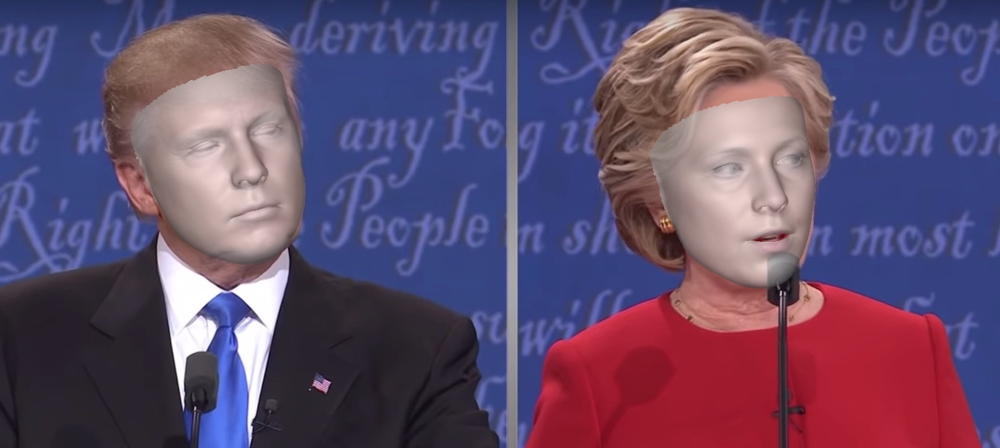

In [28]:
Image('examples/results/trump_hillary_3d.jpg')

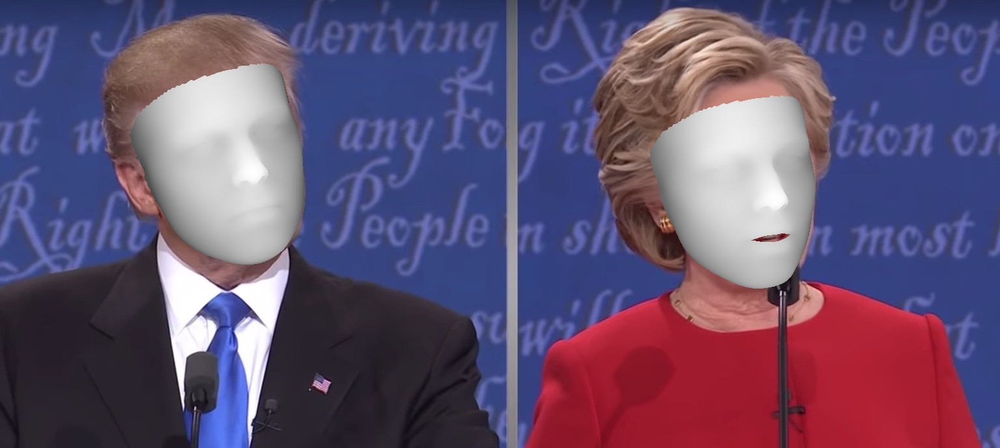

In [29]:
Image('examples/results/trump_hillary_depth.jpg')

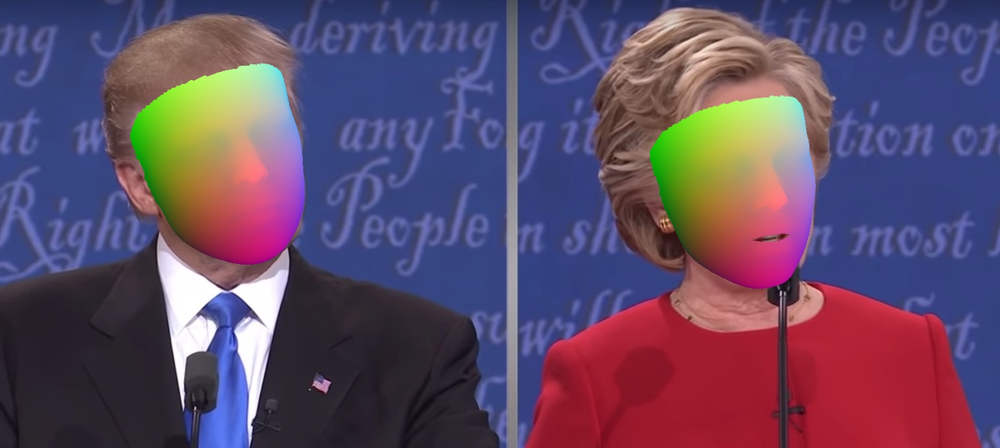

In [30]:
Image('examples/results/trump_hillary_pncc.jpg')

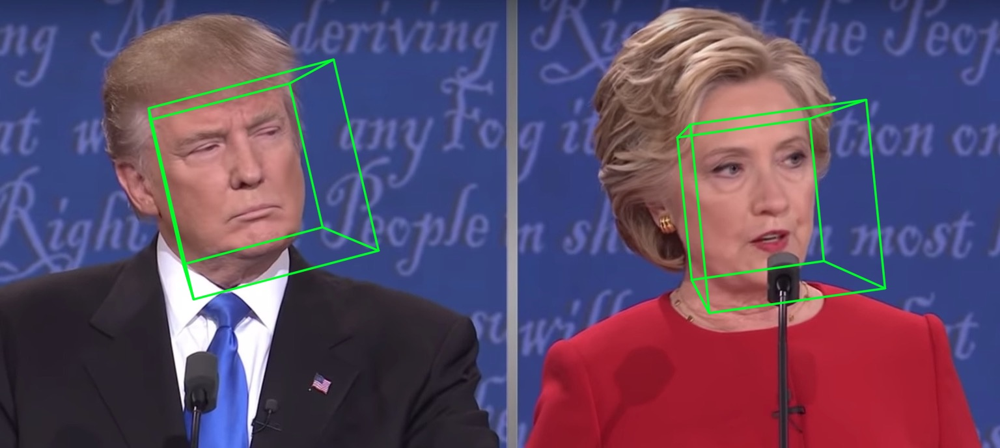

In [31]:
Image('examples/results/trump_hillary_pose.jpg')

In [32]:
!rm -r examples/

In [52]:
import scipy.io as sio
import os

# Path to a sample .mat file
sample_mat_file = os.path.join('/kaggle/input/aflw2000-3d', 'AFLW2000/image00002.mat')

# Load the .mat file
mat_data = sio.loadmat(sample_mat_file)

# Print keys in the .mat file dictionary to see what data is available
print("Keys in mat file:", mat_data.keys())


print("Shape of 'pt3d_68':", mat_data['pt3d_68'].shape)
print("Shape of 'roi':", mat_data['roi'].shape)
print("Contents of 'pt3d_68':", mat_data['pt3d_68'])  # Optional: view the data
print("Contents of 'roi':", mat_data['roi'])  # Optional: view the data


Keys in mat file: dict_keys(['__header__', '__version__', '__globals__', 'pt2d', 'Illum_Para', 'Color_Para', 'Tex_Para', 'Shape_Para', 'Exp_Para', 'Pose_Para', 'roi', 'pt3d_68'])
Shape of 'pt3d_68': (3, 68)
Shape of 'roi': (1, 4)
Contents of 'pt3d_68': [[121.868034   122.36761    126.81924    130.83179    137.52313
  148.52173    161.52802    182.87668    213.94006    248.00537
  274.67615    293.22473    309.20724    321.27457    329.8783
  339.07126    345.24066    144.61288    158.1359     175.37297
  191.31126    205.48387    261.70496    277.2635     294.11136
  311.59164    323.95364    231.0957     229.7904     227.30476
  225.08842    202.42142    210.7933     222.43806    235.00792
  244.54094    162.57912    173.47615    188.50098    201.39299
  188.09201    172.65819    260.8649     275.8604     291.34073
  301.85168    289.989      273.8536     180.50743    192.32265
  209.19904    218.46085    228.46553    248.99286    261.81235
  243.97612    228.25139    212.72568    199

In [53]:
mat_data['pt3d_68'].shape

(3, 68)

In [56]:
mat_data['pt2d'].shape

(2, 21)

In [54]:
ver_lst_ld[0].shape

(3, 68)

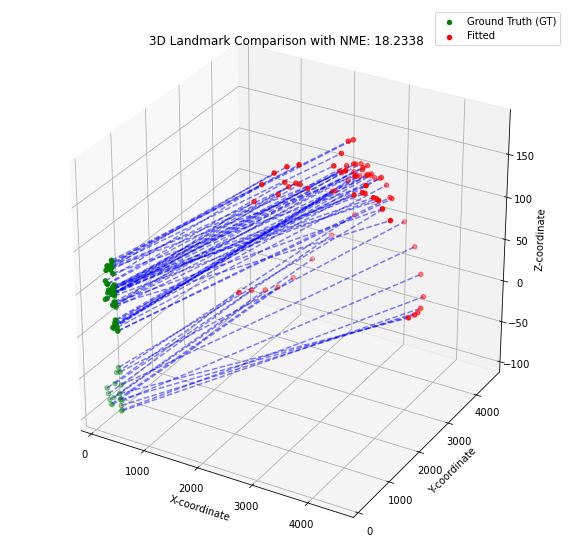

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Only for 3D plotting
from math import sqrt

def calc_nme(pts68_fit, pts68_gt, roi_box):
    std_size = 120
    sx, sy, ex, ey = roi_box
    scale_x = (ex - sx) / std_size
    scale_y = (ey - sy) / std_size

    # Scale and translate fitted points
    pts68_fit[0, :] = pts68_fit[0, :] * scale_x + sx
    pts68_fit[1, :] = pts68_fit[1, :] * scale_y + sy

    # Bounding box for normalization
    minx, maxx = np.min(pts68_gt[0, :]), np.max(pts68_gt[0, :])
    miny, maxy = np.min(pts68_gt[1, :]), np.max(pts68_gt[1, :])
    llength = sqrt((maxx - minx) * (maxy - miny))

    # Calculate NME
    dis = pts68_fit[:2, :] - pts68_gt[:2, :]
    dis = np.sqrt(np.sum(np.power(dis, 2), axis=0))
    mean_dis = np.mean(dis)
    nme = mean_dis / llength

    return nme

def plot_nme_2d(pts68_fit, pts68_gt, nme):
    plt.figure(figsize=(10, 10))
    
    # Plot ground truth landmarks
    plt.scatter(pts68_gt[0, :], pts68_gt[1, :], color='green', label="Ground Truth (GT)")
    
    # Plot fitted landmarks
    plt.scatter(pts68_fit[0, :], pts68_fit[1, :], color='red', label="Fitted")
    
    # Draw lines between corresponding points
    for i in range(68):
        plt.plot([pts68_gt[0, i], pts68_fit[0, i]], [pts68_gt[1, i], pts68_fit[1, i]], 'b--', alpha=0.5)
    
    # Display the NME
    plt.title(f"2D Landmark Comparison with NME: {nme:.4f}")
    plt.xlabel("X-coordinate")
    plt.ylabel("Y-coordinate")
    plt.legend()
    plt.show()

def plot_nme_3d(pts68_fit, pts68_gt, nme):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Plot ground truth landmarks
    ax.scatter(pts68_gt[0, :], pts68_gt[1, :], pts68_gt[2, :], color='green', label="Ground Truth (GT)")
    
    # Plot fitted landmarks
    ax.scatter(pts68_fit[0, :], pts68_fit[1, :], pts68_fit[2, :], color='red', label="Fitted")
    
    # Draw lines between corresponding points
    for i in range(68):
        ax.plot([pts68_gt[0, i], pts68_fit[0, i]], 
                [pts68_gt[1, i], pts68_fit[1, i]], 
                [pts68_gt[2, i], pts68_fit[2, i]], 'b--', alpha=0.5)

    # Display the NME
    ax.set_title(f"3D Landmark Comparison with NME: {nme:.4f}")
    ax.set_xlabel("X-coordinate")
    ax.set_ylabel("Y-coordinate")
    ax.set_zlabel("Z-coordinate")
    ax.legend()
    plt.show()

# Example usage with sample data
pts68_fit = ver_lst_ld[0]
pts68_gt = mat_data['pt3d_68']
roi_box = mat_data['roi'][0]

# Calculate NME
nme = calc_nme(pts68_fit, pts68_gt, roi_box)

# Visualize in 2D
# plot_nme_2d(pts68_fit, pts68_gt, nme)

# Visualize in 3D
plot_nme_3d(pts68_fit, pts68_gt, nme)


In [27]:
import scipy.io as sio
import os
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt

# Function to calculate NME
def calc_nme(pts68_fit, pts68_gt, roi_box):
    std_size = 120
    sx, sy, ex, ey = roi_box
    scale_x = (ex - sx) / std_size
    scale_y = (ey - sy) / std_size

    # Scale and translate fitted points
    pts68_fit[0, :] = pts68_fit[0, :] * scale_x + sx
    pts68_fit[1, :] = pts68_fit[1, :] * scale_y + sy

    # Bounding box for normalization
    minx, maxx = np.min(pts68_gt[0, :]), np.max(pts68_gt[0, :])
    miny, maxy = np.min(pts68_gt[1, :]), np.max(pts68_gt[1, :])
    llength = sqrt((maxx - minx) * (maxy - miny))

    # Calculate NME
    dis = pts68_fit[:2, :] - pts68_gt[:2, :]
    dis = np.sqrt(np.sum(np.power(dis, 2), axis=0))
    mean_dis = np.mean(dis)
    nme = mean_dis / llength

    return nme

# Directory containing the dataset
data_dir = '/kaggle/input/aflw2000-3d/AFLW2000'

# Initialize list to store NMEs and counter
nme_list = []
processed_images = 0

# Loop through the first 1000 images
for i in range(2, 4100):  # Assuming even numbers are image files, e.g., image00002, image00004...
    img_filename = f'image{str(i).zfill(5)}.jpg'
    mat_filename = f'image{str(i).zfill(5)}.mat'

    # File paths
    img_fp = os.path.join(data_dir, img_filename)
    mat_fp = os.path.join(data_dir, mat_filename)
    
    # Check if both the image and .mat file exist
    if not os.path.exists(img_fp) or not os.path.exists(mat_fp):
#         print(f"Skipping {img_filename} and/or {mat_filename} - file(s) not found.")
        continue

    # Load the .mat file
    mat_data = sio.loadmat(mat_fp)
    
    # Extract ground truth points and ROI box
    pts68_gt = mat_data['pt3d_68']
    roi_box = mat_data['roi'][0]
    
    # Perform face fitting to get pts68_fit (using your method or model)
    img = cv2.imread(img_fp)
    boxes = face_boxes(img)
    
    if not boxes:
        print(f"No faces detected in {img_filename}.")
        continue
    
    param_lst, roi_box_lst = tddfa(img, boxes)
    ver_lst = tddfa.recon_vers(param_lst, roi_box_lst, dense_flag=False)
    pts68_fit = ver_lst[0]  # Assuming the first face is the target

    # Calculate NME
    nme = calc_nme(pts68_fit, pts68_gt, roi_box)
    nme_list.append(nme)
    
    # Increment the counter
    processed_images += 1

# Calculate the average NME for all images
if nme_list:
    avg_nme = np.mean(nme_list)
    print(f"Average NME for processed images: {avg_nme}")
    print(f"Total images processed: {processed_images}")
else:
    print("No images were processed due to missing files or other issues.")



No faces detected in image00482.jpg.
No faces detected in image00497.jpg.
No faces detected in image00617.jpg.
No faces detected in image00696.jpg.
No faces detected in image00862.jpg.
No faces detected in image01262.jpg.
No faces detected in image01509.jpg.
No faces detected in image01586.jpg.
No faces detected in image01591.jpg.
No faces detected in image01670.jpg.
No faces detected in image01698.jpg.
No faces detected in image01720.jpg.
No faces detected in image01773.jpg.
No faces detected in image01847.jpg.
No faces detected in image01869.jpg.
No faces detected in image02000.jpg.
No faces detected in image02139.jpg.
No faces detected in image02156.jpg.
No faces detected in image02254.jpg.
No faces detected in image02474.jpg.
No faces detected in image02539.jpg.
No faces detected in image02598.jpg.
No faces detected in image02674.jpg.
No faces detected in image02721.jpg.
No faces detected in image02746.jpg.
No faces detected in image02773.jpg.
No faces detected in image02832.jpg.
N

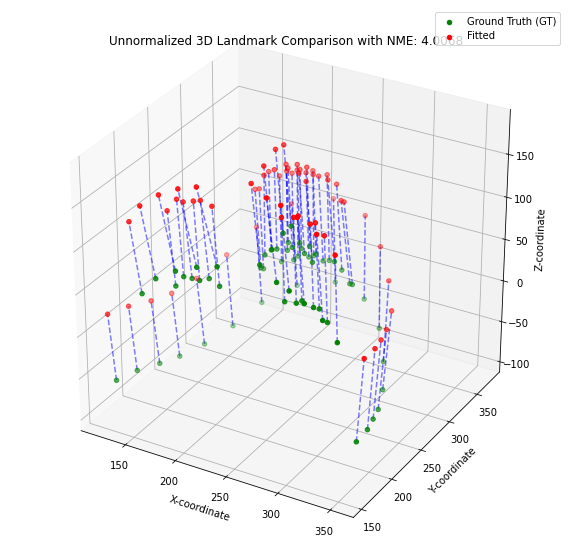

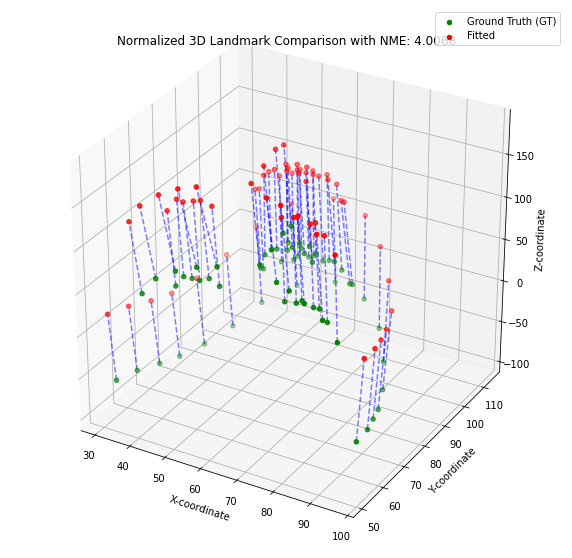

In [63]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Only for 3D plotting
from math import sqrt

def calc_nme(pts68_fit, pts68_gt, roi_box):
    std_size = 120
    sx, sy, ex, ey = roi_box
    scale_x = (ex - sx) / std_size
    scale_y = (ey - sy) / std_size

    # Scale and translate fitted points
    pts68_fit[0, :] = pts68_fit[0, :] * scale_x + sx
    pts68_fit[1, :] = pts68_fit[1, :] * scale_y + sy

    # Bounding box for normalization
    minx, maxx = np.min(pts68_gt[0, :]), np.max(pts68_gt[0, :])
    miny, maxy = np.min(pts68_gt[1, :]), np.max(pts68_gt[1, :])
    llength = sqrt((maxx - minx) * (maxy - miny))

    # Calculate NME
    dis = pts68_fit[:2, :] - pts68_gt[:2, :]
    dis = np.sqrt(np.sum(np.power(dis, 2), axis=0))
    mean_dis = np.mean(dis)
    nme = mean_dis / llength

    return nme

def normalize_points(pts, roi_box):
    std_size = 120
    sx, sy, ex, ey = roi_box
    scale_x = (ex - sx) / std_size
    scale_y = (ey - sy) / std_size

    pts_normalized = np.copy(pts)
    pts_normalized[0, :] = (pts[0, :] - sx) / scale_x
    pts_normalized[1, :] = (pts[1, :] - sy) / scale_y

    return pts_normalized

def plot_landmarks_2d(pts_fit, pts_gt, nme, title):
    plt.figure(figsize=(10, 10))
    
    # Plot ground truth landmarks
    plt.scatter(pts_gt[0, :], pts_gt[1, :], color='green', label="Ground Truth (GT)")
    
    # Plot fitted landmarks
    plt.scatter(pts_fit[0, :], pts_fit[1, :], color='red', label="Fitted")
    
    # Draw lines between corresponding points
    for i in range(68):
        plt.plot([pts_gt[0, i], pts_fit[0, i]], [pts_gt[1, i], pts_fit[1, i]], 'b--', alpha=0.5)
    
    # Display the NME
    plt.title(f"{title} with NME: {nme:.4f}")
    plt.xlabel("X-coordinate")
    plt.ylabel("Y-coordinate")
    plt.legend()
    plt.show()

def plot_landmarks_3d(pts_fit, pts_gt, nme, title):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Plot ground truth landmarks
    ax.scatter(pts_gt[0, :], pts_gt[1, :], pts_gt[2, :], color='green', label="Ground Truth (GT)")
    
    # Plot fitted landmarks
    ax.scatter(pts_fit[0, :], pts_fit[1, :], pts_fit[2, :], color='red', label="Fitted")
    
    # Draw lines between corresponding points
    for i in range(68):
        ax.plot([pts_gt[0, i], pts_fit[0, i]], 
                [pts_gt[1, i], pts_fit[1, i]], 
                [pts_gt[2, i], pts_fit[2, i]], 'b--', alpha=0.5)

    # Display the NME
    ax.set_title(f"{title} with NME: {nme:.4f}")
    ax.set_xlabel("X-coordinate")
    ax.set_ylabel("Y-coordinate")
    ax.set_zlabel("Z-coordinate")
    ax.legend()
    plt.show()

# Example usage with sample data
pts68_fit = ver_lst_ld[0]
pts68_gt = mat_data['pt3d_68']
roi_box = mat_data['roi'][0]

# Calculate NME for unnormalized points
nme_unnormalized = calc_nme(np.copy(pts68_fit), np.copy(pts68_gt), roi_box)

# Plot unnormalized 2D and 3D landmarks
# plot_landmarks_2d(pts68_fit, pts68_gt, nme_unnormalized, "Unnormalized 2D Landmark Comparison")
plot_landmarks_3d(pts68_fit, pts68_gt, nme_unnormalized, "Unnormalized 3D Landmark Comparison")

# Normalize points for visualization
pts68_fit_normalized = normalize_points(pts68_fit, roi_box)
pts68_gt_normalized = normalize_points(pts68_gt, roi_box)

# Calculate NME for normalized points (optional, should be the same as unnormalized)
nme_normalized = calc_nme(np.copy(pts68_fit_normalized), np.copy(pts68_gt_normalized), roi_box)

# Plot normalized 2D and 3D landmarks
#plot_landmarks_2d(pts68_fit_normalized, pts68_gt_normalized, nme_normalized, "Normalized 2D Landmark Comparison")
plot_landmarks_3d(pts68_fit_normalized, pts68_gt_normalized, nme_normalized, "Normalized 3D Landmark Comparison")


In [72]:
# Load the source and target images
source_img = cv2.imread('/kaggle/input/deepfake/R.jpeg')
target_img = cv2.imread('/kaggle/input/deepfake/RR.jpg')

# Set the desired width and height (you can adjust these based on your needs)
desired_width = 512
desired_height = 512

# Resize both images to the same size
resized_source_img = cv2.resize(source_img, (desired_width, desired_height))
resized_target_img = cv2.resize(target_img, (desired_width, desired_height))

In [73]:
def vertices(img):
    # face detection
    boxes = face_boxes(img)
    print(f'Detect {len(boxes)} faces')
    print(boxes)

    # regress 3DMM params
    param_lst, roi_box_lst = tddfa(img, boxes)

    # reconstruct vertices and visualizing sparse landmarks
    dense_flag = False
    ver_lst = tddfa.recon_vers(param_lst, roi_box_lst, dense_flag=dense_flag)
    draw_landmarks(img, ver_lst, dense_flag=dense_flag)

    ver_lst_ld = ver_lst

    # reconstruct vertices and visualizing dense landmarks
    dense_flag = True
    ver_lst = tddfa.recon_vers(param_lst, roi_box_lst, dense_flag=dense_flag)
    draw_landmarks(img, ver_lst, dense_flag=dense_flag)
    
    return ver_lst

Detect 1 faces
[[202.79932, 184.70096, 275.73254, 274.30737, 0.9991886]]
Detect 1 faces
[[190.29483, 89.10186, 318.9279, 253.58359, 0.9998591]]


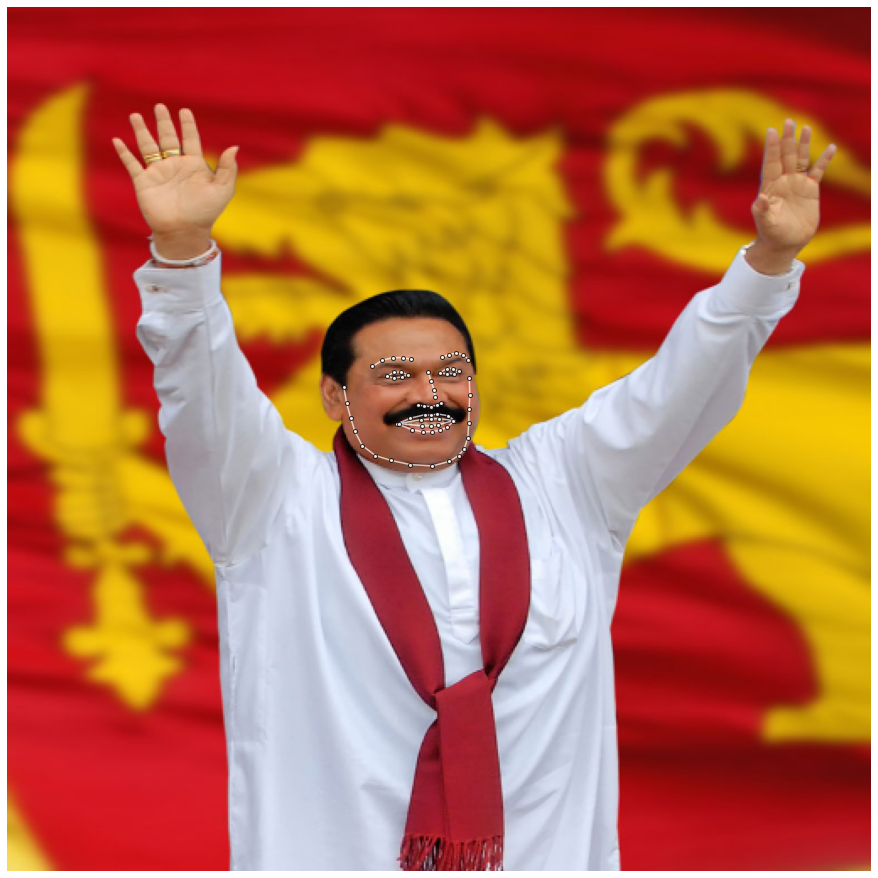

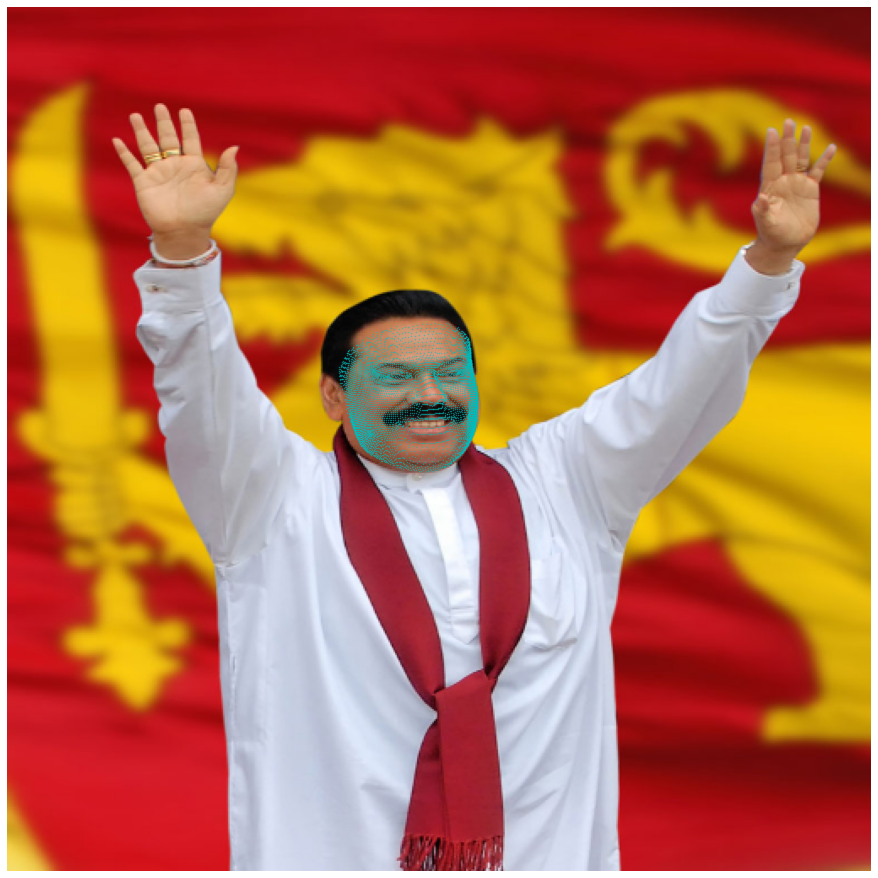

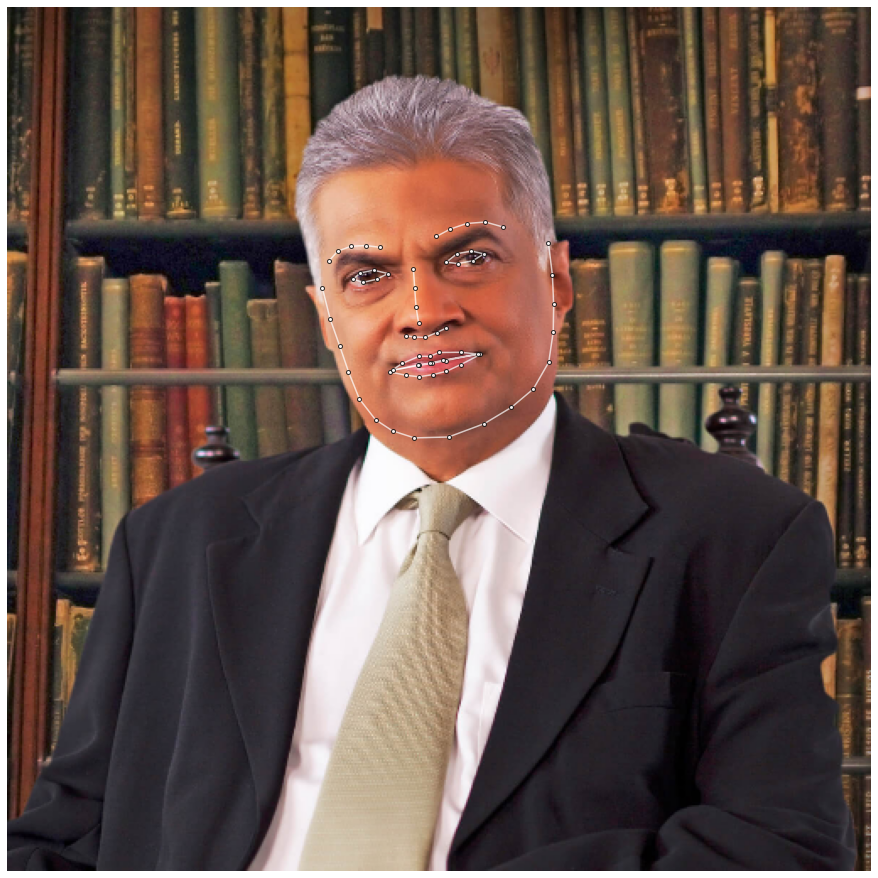

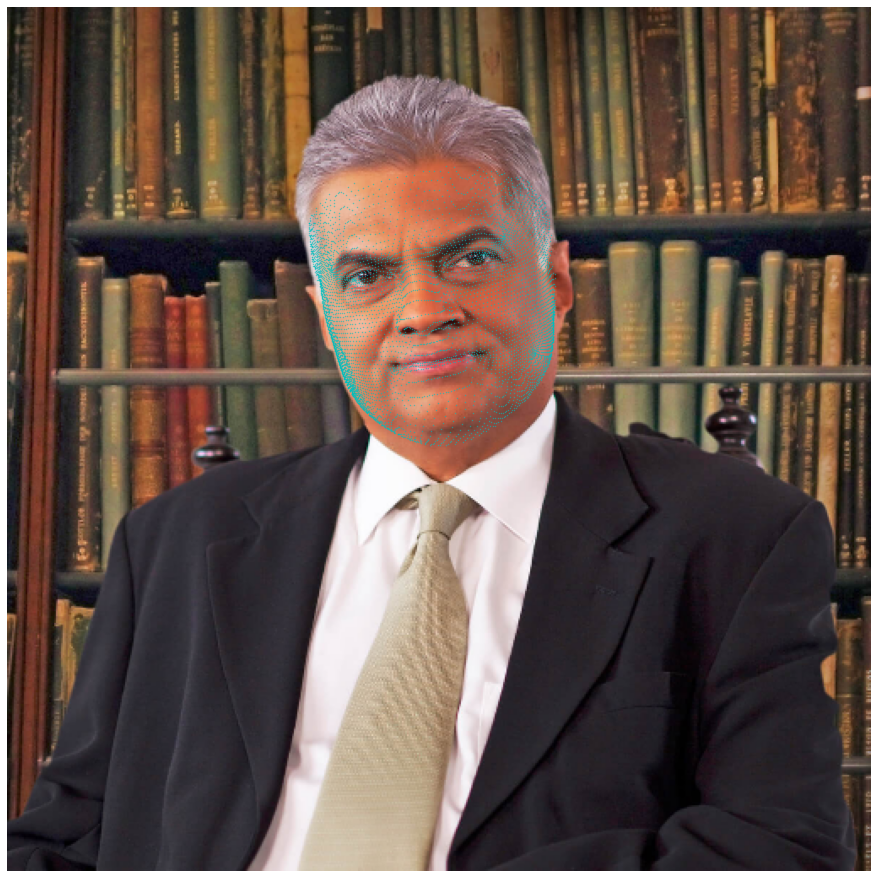

In [79]:
vertices(resized_source_img)
source_ver = ver_lst
source_face = boxes

vertices(resized_target_img)
target_ver = ver_lst
target_face = boxes

In [83]:
affine_transform = cv2.estimateAffinePartial2D(source_ver[0], source_face)
aligned_target = cv2.warpAffine(resized_target_img, affine_transform[0], (resized_target_img.shape[1], resized_target_img.shape[0]))

TypeError: Expected Ptr<cv::UMat> for argument 'to'

In [84]:
source_ver[0].shape

(3, 68)

In [87]:
# Project to 2D by taking the first two dimensions (x, y)
source_keypoints_2d = source_ver[0][:2].T.astype(np.float32)
target_keypoints_2d = target_ver[0][:2].T.astype(np.float32)

# Calculate an affine transformation matrix to align source keypoints to target keypoints
transformation_matrix, _ = cv2.estimateAffinePartial2D(source_keypoints_2d, target_keypoints_2d)

# Apply the transformation to the source image to align it with the target
aligned_source_img = cv2.warpAffine(source_img, transformation_matrix, (target_img.shape[1], target_img.shape[0]))

# Create a convex hull mask from source keypoints to isolate the face
# Convert the convex hull points to integer type
hull = cv2.convexHull(source_keypoints_2d).astype(int)

# Now, create the mask and fill the convex polygon
mask = np.zeros_like(source_img[:, :, 0])  # Single-channel mask
cv2.fillConvexPoly(mask, hull, 255)

# Warp the mask to match the target image
aligned_mask = cv2.warpAffine(mask, transformation_matrix, (target_img.shape[1], target_img.shape[0]))

# Remove the background of the aligned source image
face_only = cv2.bitwise_and(aligned_source_img, aligned_source_img, mask=aligned_mask)

# Place the aligned face onto the target image using a mask
target_face_removed = cv2.bitwise_and(target_img, target_img, mask=cv2.bitwise_not(aligned_mask))
output_img = cv2.add(target_face_removed, face_only)

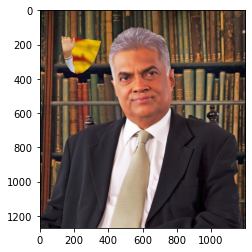

In [92]:

plt.imshow(output_img[:, :, ::-1])
